In [1]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go # visualize point clouds
import cv2
import math
import os
import pandas as pd

## Filestructure
You can download the data in the LiDAR/RADAR moodle course (Dataset2022): https://elearning.rwu.de/course/view.php?id=2344.  
The downloaded file is a zip, to use it you have to unzip it.  
After unzipping you will find two folders in _Dataset2022_ you will find two folders:
* _record1_ - forth and back drive of the car (240 Frames)
* _record2_ - right to left drive of the car (100 Frames)

Inside every recording folder you find 5 folders:
* _blickfeld_ - containing the data from the Blickfeld Cube (.csv files)
* _camera_ - containing the data from the camera (.jpg files)
* _groundtruth_ - containing the data for the bounding box around the vehicel (.csv files)
* _radar_ - containing the data from the Texas Instruments RADAR (.csv files)
* _velodyne_ - containing the data from the Velodyne Puck (.csv files)

So we can set pathes to the data:

In [2]:
record_number = 1 # Either record 1 or record 2

root = f"C:/Users/IEM-Laptop15/Downloads/Dataset2022/record1"
path_blickfeld = f"{root}/blickfeld"
path_camera = f"{root}/camera"
path_radar = f"{root}/radar"
path_velodyne = f"{root}/velodyne"

### Loading the data
To work with the data we have to load it into our python script. The data here are either .jpg files or .csv files. There are multiple ways to load these types of files. We will present here one way.
#### Loading .csv files
CSV is an acronym for Comma-Separated Values. While typically commas are used to seperate the values, they can also be seperated by whitespace or other symbols. In our files the data is seperated by whitespaces. Hence, for loading the data we will use the numpy function loadtxt (https://numpy.org/doc/stable/reference/generated/numpy.loadtxt.html). Because of the given datastructure, we can use the default parameters of loadtxt and just have to give the file path.  
As .csv files are the point clouds stored and the groundtruth.
#### Loading .jpg files
JPG files contain an compressed digital image. To load this we will use here a the function imread from cv2 (https://docs.opencv.org/3.4/d4/da8/group__imgcodecs.html#ga288b8b3da0892bd651fce07b3bbd3a56). The function also just takes the image path.

In [3]:
def readPC(path):
    """
       Will return a numpy array of
       shape:
       Nx4 for LiDAR Data (x,y,z,itensity)
       Nx5 for RADAR Data (x,y,z,velocity,itensity)
       
    """
    return np.loadtxt(path)

def readImage(path):
    """
       Will return an numpy array of
       shape height x width x 3.
    """
    return cv2.imread(path) #[:,:,[2,1,0]]   #### cv2.imread() method loads an image from the specified file

def readLabels(path):
    """
       Reads the ground truth labels.
       In the labels are the following
       information stored:
       1. width in m
       2. length in m
       3. height in m
       4.-6. Coordinates of the center in m
       7. yaw rotation in degree
    """
    return np.loadtxt(path)

In [4]:
frame_id = 1


pc_radar = readPC(f"{path_radar}/{frame_id:06d}.csv")
print(f"{path_radar}/{frame_id:06d}.csv")


img = readImage(f"{path_camera}/{frame_id:06d}.jpg")
print(f"{path_camera}/{frame_id:06d}.jpg")

C:/Users/IEM-Laptop15/Downloads/Dataset2022/record1/radar/000001.csv
C:/Users/IEM-Laptop15/Downloads/Dataset2022/record1/camera/000001.jpg


In [5]:
 ### To get the dimensions of the array

print(f"Radar point cloud shape: {pc_radar.shape}\n\
Image shape: {img.shape}")  ### The output gives the dimensions variable to get width, height and number of channels for each pixel.

### width : 720
### height : 1280
### No of channels per pixel : 3

Radar point cloud shape: (177, 5)
Image shape: (720, 1280, 3)


In [6]:
pc_radar

array([[ 7.91632831e-01,  2.54650745e+01, -4.62632561e+00,
        -1.80251002e+00,  1.72726078e+01],
       [ 4.02277052e-01,  2.58901005e+01, -2.01144606e-01,
        -1.80251002e+00,  1.72726078e+01],
       [-4.02277052e-01,  2.58901005e+01,  2.01144606e-01,
        -1.80251002e+00,  1.72726078e+01],
       [-1.57852161e+00,  2.53519421e+01,  5.02861500e+00,
        -1.80251002e+00,  1.72726078e+01],
       [ 8.14050972e-01,  2.61862164e+01,  6.10704064e-01,
        -1.80251002e+00,  1.82280674e+01],
       [ 3.99384975e-01,  2.57039700e+01,  5.08920050e+00,
        -1.80251002e+00,  1.82280674e+01],
       [-3.99384975e-01,  2.57039700e+01, -5.08920050e+00,
        -1.80251002e+00,  1.82280674e+01],
       [-8.02293420e-01,  2.58080025e+01, -4.47849655e+00,
        -1.80251002e+00,  1.82280674e+01],
       [-1.62854421e+00,  2.61553326e+01, -7.36664724e-15,
        -1.80251002e+00,  1.82280674e+01],
       [ 8.09519947e-01,  2.60404644e+01, -4.94379520e+00,
        -1.80251002e+00

In [7]:
img

array([[[253, 255, 195],
        [253, 255, 195],
        [253, 255, 196],
        ...,
        [254, 255, 229],
        [254, 255, 229],
        [254, 255, 229]],

       [[253, 255, 195],
        [253, 255, 195],
        [253, 255, 196],
        ...,
        [254, 255, 229],
        [254, 255, 229],
        [254, 255, 229]],

       [[253, 255, 195],
        [253, 255, 195],
        [253, 255, 196],
        ...,
        [254, 255, 229],
        [254, 255, 229],
        [254, 255, 229]],

       ...,

       [[100,  98,  80],
        [102, 100,  82],
        [101,  99,  81],
        ...,
        [ 78,  66,  62],
        [ 82,  70,  66],
        [ 93,  81,  77]],

       [[ 97,  95,  77],
        [100,  98,  80],
        [ 99,  97,  79],
        ...,
        [ 86,  74,  70],
        [ 91,  79,  75],
        [105,  93,  89]],

       [[ 93,  91,  73],
        [ 97,  95,  77],
        [ 98,  96,  78],
        ...,
        [ 97,  85,  81],
        [ 97,  85,  81],
        [105,  93,  89]]

## Visualization
To understand the data easier, we visualize them. We can use the package matplotlib.pyplot and/or plotly.

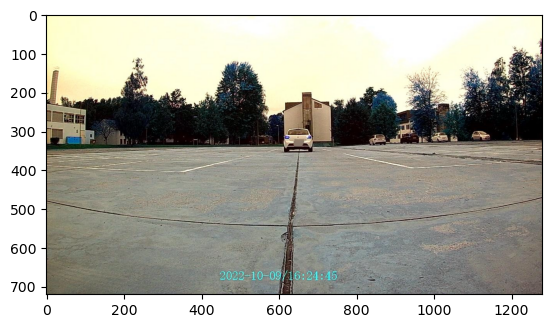

In [8]:
plt.imshow(img) # cv2 color order is (blue, green, red) 
                # and of matplotlib.pyplot is (red, green, blue)

In [9]:
def readImage(path):
    """
       Will return an numpy array of
       shape height x width x 3.
    """
    return cv2.imread(path)[:,:,[2,1,0]]    ### cv2.imread() method loads an image from the specified path

In [10]:
img = readImage(f"{path_camera}/{frame_id:06d}.jpg")
print(f"{path_camera}/{frame_id:06d}.jpg")

C:/Users/IEM-Laptop15/Downloads/Dataset2022/record1/camera/000001.jpg


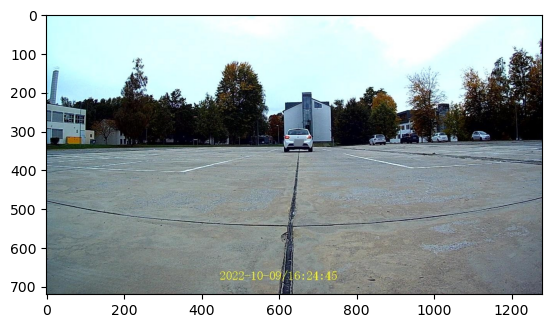

In [11]:
plt.imshow(img)

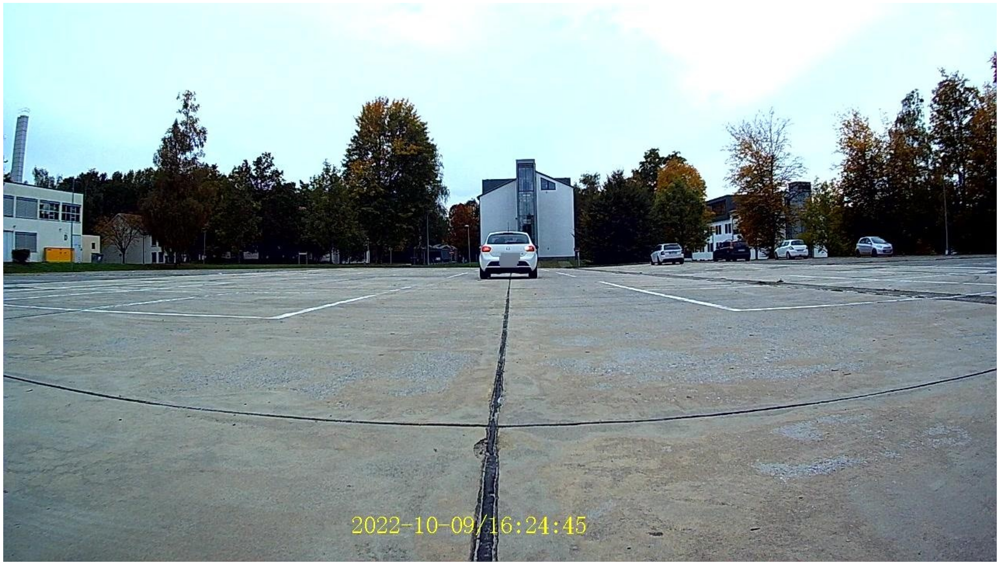

In [12]:
plt.figure(figsize=(40,30)) # Size of the Figure
plt.axis("off") # Deletes the axis
plt.imshow(img) 

Can use matplotlib.pyplot.scatter to visualize the point clouds, but only 2D.

For 3D we can use plotly.graph_objects:

In [13]:
data = [go.Scatter3d(x = pc_radar[:,0],
                     y = pc_radar[:,1],
                     z = pc_radar[:,2],
                    mode='markers', type='scatter3d',
                    text=np.arange(pc_radar.shape[0]),
                    marker={
                        'size': 2,
                        'color': pc_radar[:,2],
                        'colorscale':'rainbow',
})
]

go.Figure(data=data)

In [14]:
data = [go.Scatter3d(x = pc_radar[:,0],
                     y = pc_radar[:,1],
                     z = pc_radar[:,2],
                    mode='markers', type='scatter3d',
                    text=np.arange(pc_radar.shape[0]),
                    marker={
                        'size': 2,
                        'color': pc_radar[:,2],
                        'colorscale':'rainbow',
})
]
layout = go.Layout(
    scene={
        'xaxis': {'range': [-20, 20]},
        'yaxis': {'range': [0, 40]},
        'zaxis': {'range': [-20., 20.]},
    }
                        
)
go.Figure(data=data,layout=layout)

In [15]:
data = [     
                go.Scatter3d(x = pc_radar[:,0],
                    y = pc_radar[:,1],
                    z = pc_radar[:,2],
                    mode='markers', type='scatter3d',
                    text=np.arange(pc_radar.shape[0]),
                    marker={
                        'size': 2,
                        'color': "blue",
                        'colorscale':'rainbow',
})
]
layout = go.Layout(
    scene={
        'xaxis': {'range': [-20, 20], 'rangemode': 'tozero', 'tick0': -5},
        'yaxis': {'range': [0, 40], 'rangemode': 'tozero', 'tick0': -5},
        'zaxis': {'range': [-20., 20.], 'rangemode': 'tozero'}
    }
)
go.Figure(data=data, layout = layout)

In [16]:
def get_nonzero_velocities(pc_radar):
    r_velocity=pc_radar[:,3]
    dynamicPoints_index = np.nonzero(r_velocity)
    dynamic_pts_arr = r_velocity[np.nonzero(r_velocity)]
    dyn_neg_pts = []
    #if i in dynamic_pts_arr < 0:
     #   dyn_neg_pts.append(i)
    #print("negative velocities:", dyn_neg_pts)
    print("dyn pts velocities:", dynamic_pts_arr)
    return dynamicPoints_index

In [17]:
def isolate_dynamic_from_static_points(pc_radar):
    dynamicPoints = get_nonzero_velocities(pc_radar)    
        
    x = pc_radar[:,0]
    y = pc_radar[:,1]

    x_axis = []
    y_axis = []
    

    for i in dynamicPoints:
        x_axis.append(x[i])
        y_axis.append(y[i])

    return x_axis, y_axis


In [18]:
isolate_dynamic_from_static_points(pc_radar)

dyn pts velocities: [-1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002
 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002
 -1.80251002 -1.80251002  1.12656879  1.12656879  1.12656879  1.12656879
  1.12656879  1.12656879  1.12656879  1.12656879  1.12656879  1.12656879
  1.12656879  1.12656879  1.12656879  1.12656879  1.12656879  1.12656879
  1.12656879  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246
  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246
  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246
  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246
  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246
  1.35188246  1.35188246  1.35188246  1.35188246  1.57719624  1.57719624
  1.57719624  1.57719624  1.57719624  1.57719624  1.57719624  1.57719624
  1.57719624  1.57719624  1.57719624  1.57719624  1.57719624  1.57719624
  1.57719624  1.57719624  1.577

([array([ 7.91632831e-01,  4.02277052e-01, -4.02277052e-01, -1.57852161e+00,
          8.14050972e-01,  3.99384975e-01, -3.99384975e-01, -8.02293420e-01,
         -1.62854421e+00,  8.09519947e-01,  4.11970496e-01, -4.11970496e-01,
         -8.23742092e-01, -1.61397135e+00,  3.61961961e+00,  2.81466460e+00,
          2.35594893e+00,  2.01089978e+00,  1.57063270e+00,  1.20672190e+00,
          7.86683023e-01,  8.60624302e-14, -4.02277052e-01,  3.60526776e+00,
          2.44252157e+00,  1.99999046e+00,  1.62849510e+00,  1.20344019e+00,
          8.14247549e-01,  8.83330681e-14, -3.98745865e-01,  3.52436042e+00,
          3.10341883e+00,  2.73733282e+00,  2.38436627e+00,  1.95523775e+00,
          1.58957756e+00,  1.16378200e+00,  7.94860721e-01,  8.62924098e-14,
          3.61961961e+00,  2.81466460e+00,  2.37141728e+00,  2.01089978e+00,
          1.57852161e+00,  1.20672190e+00,  7.86683023e-01,  8.60624302e-14,
         -3.97404581e-01,  3.60526776e+00,  2.44274259e+00,  1.98694491e+00,

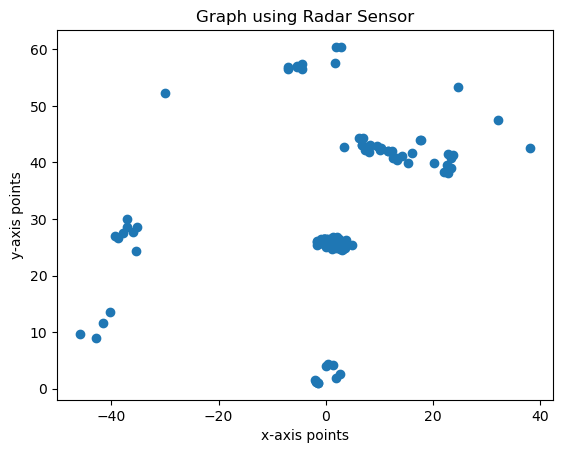

In [19]:
x_radar_points=pc_radar[:, 0]
y_radar_points=pc_radar[:, 1]
plt.scatter(x_radar_points,y_radar_points)
plt.title("Graph using Radar Sensor")
plt.xlabel('x-axis points')
plt.ylabel('y-axis points')
plt.show()

dyn pts velocities: [-1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002
 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002
 -1.80251002 -1.80251002  1.12656879  1.12656879  1.12656879  1.12656879
  1.12656879  1.12656879  1.12656879  1.12656879  1.12656879  1.12656879
  1.12656879  1.12656879  1.12656879  1.12656879  1.12656879  1.12656879
  1.12656879  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246
  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246
  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246
  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246
  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246
  1.35188246  1.35188246  1.35188246  1.35188246  1.57719624  1.57719624
  1.57719624  1.57719624  1.57719624  1.57719624  1.57719624  1.57719624
  1.57719624  1.57719624  1.57719624  1.57719624  1.57719624  1.57719624
  1.57719624  1.57719624  1.577

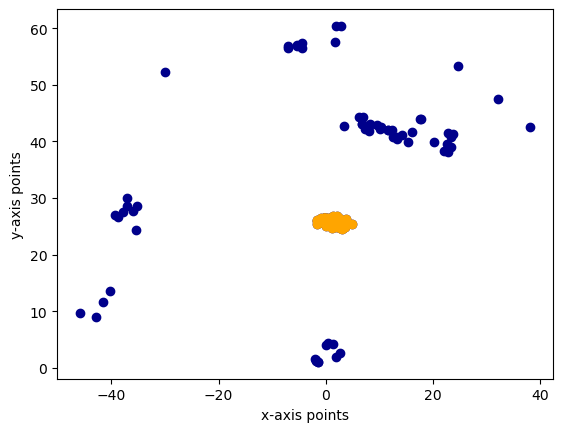

In [20]:
x_axis,y_axis = isolate_dynamic_from_static_points(pc_radar)

plt.scatter(x_radar_points,y_radar_points, color='darkblue')
plt.scatter(x_axis,y_axis, color='orange')

plt.xlabel('x-axis points')
plt.ylabel('y-axis points')
plt.show()

In [21]:
def calculate_distance_to_centre(x_axis, y_axis):
    center_x = np.mean(x_axis)
    center_y = np.mean(y_axis)
    
    dist = math.sqrt((center_x*center_x)+(center_y*center_y))
    print(dist)
    return dist

In [22]:
calculate_distance_to_centre(x_axis, y_axis)

25.791436747656487


25.791436747656487

In [23]:
root = f"C:/Users/IEM-Laptop15/Documents/LRS/Task1/record1"
distance = []

for i in range(239):
    pc_radar = readPC(f"{root}/radar/{i:06d}.csv")
    x_axis, y_axis = isolate_dynamic_from_static_points(pc_radar)
    dist = calculate_distance_to_centre(x_axis, y_axis)
    distance.append(dist)
    
print(len(distance))

dyn pts velocities: [-1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002
 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002
 -1.80251002 -1.80251002 -1.80251002 -1.57719624 -1.57719624 -1.57719624
 -1.57719624 -1.57719624  1.12656879  1.12656879  1.12656879  1.12656879
  1.12656879  1.12656879  1.12656879  1.12656879  1.12656879  1.12656879
  1.12656879  1.12656879  1.12656879  1.12656879  1.12656879  1.35188246
  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246
  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246
  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246
  1.35188246  1.35188246  1.35188246  1.35188246  1.57719624  1.57719624
  1.57719624  1.57719624  1.57719624  1.57719624  1.57719624  1.57719624
  1.57719624  1.57719624  1.57719624  1.57719624  1.57719624  1.57719624
  1.57719624  1.57719624  1.57719624  1.57719624  1.57719624  1.57719624
  1.57719624  1.57719624  1.577

dyn pts velocities: [-1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002
 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002
 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002
 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002
 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002
 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.57719624
 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624
 -1.57719624  1.12656879  1.12656879  1.12656879  1.12656879  1.12656879
  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246
  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246
  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246
  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246
  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246  1.35188246
  1.35188246  1.35188246  1.351

dyn pts velocities: [-1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002
 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.80251002 -1.57719624
 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624
 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624
 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624
 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624
 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624
 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624
 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624
 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624
 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624
 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.57719624 -1.35188246
 -1.35188246 -1.35188246 -1.35188246 -1.35188246 -1.35188246 -1.35188246
 -1.35188246 -1.35188246 -1.351

dyn pts velocities: [-1.35188246 -1.35188246 -1.35188246 -1.35188246 -1.35188246 -1.35188246
 -1.35188246 -1.35188246 -1.35188246 -1.35188246 -1.35188246 -1.35188246
 -1.35188246 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879
 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879
 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879
 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879
 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879
 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879
 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879
 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879
 -1.12656879 -0.90125501 -0.90125501 -0.90125501 -0.90125501 -0.90125501
 -0.90125501 -0.90125501 -0.90125501 -0.90125501 -0.90125501 -0.90125501
 -0.90125501 -0.90125501 -0.90125501 -0.90125501 -0.90125501 -0.90125501
 -0.90125501 -0.90125501 -0.901

dyn pts velocities: []
nan
dyn pts velocities: []
nan
dyn pts velocities: []
nan
dyn pts velocities: []
nan
dyn pts velocities: []
nan
dyn pts velocities: []
nan
dyn pts velocities: []
nan
dyn pts velocities: []
nan
dyn pts velocities: [-0.22531375 -0.22531375 -0.22531375 -0.22531375 -0.22531375 -0.22531375
 -0.22531375 -0.22531375 -0.22531375  0.22531375  0.22531375  0.22531375
  0.22531375  0.22531375  0.22531375  0.22531375  0.22531375  0.22531375
  0.22531375]
2.9218612073201955
dyn pts velocities: [-0.45062751 -0.45062751 -0.45062751 -0.45062751 -0.45062751 -0.45062751
 -0.45062751 -0.45062751 -0.45062751 -0.45062751 -0.45062751 -0.45062751
 -0.22531375 -0.22531375 -0.22531375 -0.22531375 -0.22531375 -0.22531375
 -0.22531375 -0.22531375 -0.22531375 -0.22531375 -0.22531375 -0.22531375
 -0.22531375 -0.22531375 -0.22531375  0.22531375  0.22531375  0.22531375
  0.22531375  0.22531375  0.22531375  0.22531375  0.22531375  0.22531375
  0.22531375  0.22531375  0.22531375  0.22531375  0.22

dyn pts velocities: [-1.35188246 -1.35188246 -1.35188246 -1.35188246 -1.35188246 -1.35188246
 -1.35188246 -1.35188246 -1.35188246 -1.12656879 -1.12656879 -1.12656879
 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879
 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879
 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879
 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879
 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879
 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879
 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -0.90125501 -0.90125501
 -0.90125501 -0.90125501 -0.90125501 -0.90125501 -0.90125501]
11.601895439144206
dyn pts velocities: [-1.35188246 -1.35188246 -1.35188246 -1.35188246 -1.35188246 -1.35188246
 -1.35188246 -1.35188246 -1.35188246 -1.35188246 -1.35188246 -1.12656879
 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879 -1.12656879
 -1

C:\Users\IEM-Laptop15\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning:

Mean of empty slice.

C:\Users\IEM-Laptop15\anaconda3\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning:

invalid value encountered in double_scalars



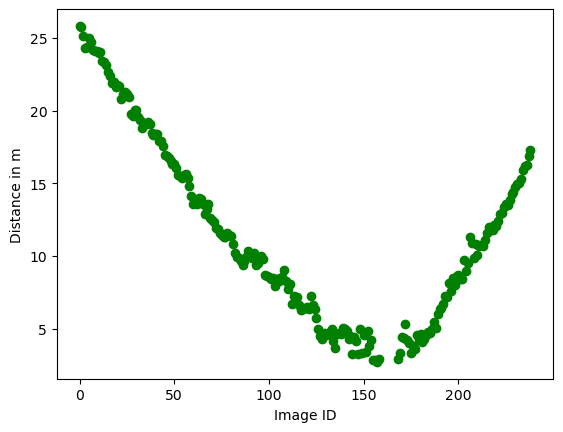

In [24]:
ID=[]
for i in range(239):
    ID.append(i)

plt.scatter(ID, distance, color='green')
plt.ylabel('Distance in m')
plt.xlabel('Image ID')
plt.show()